1. Reduction des bruits

Mounted at /content/drive


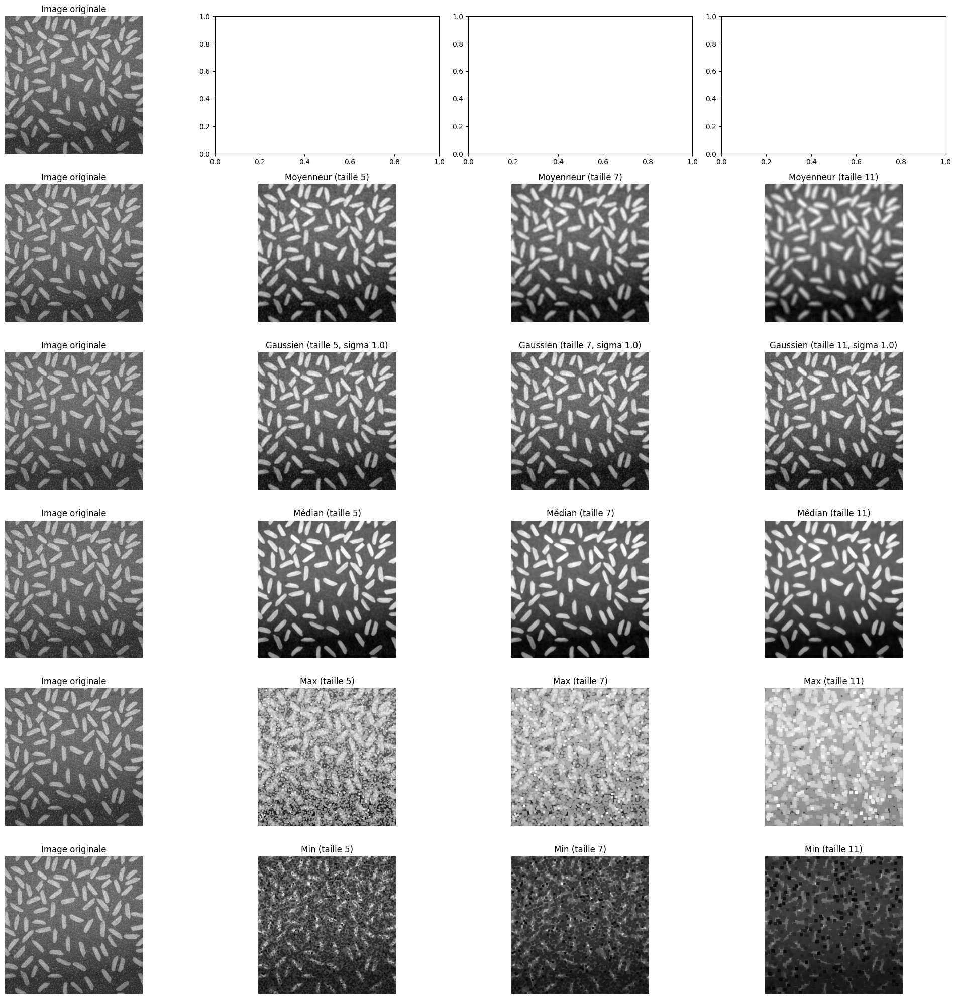

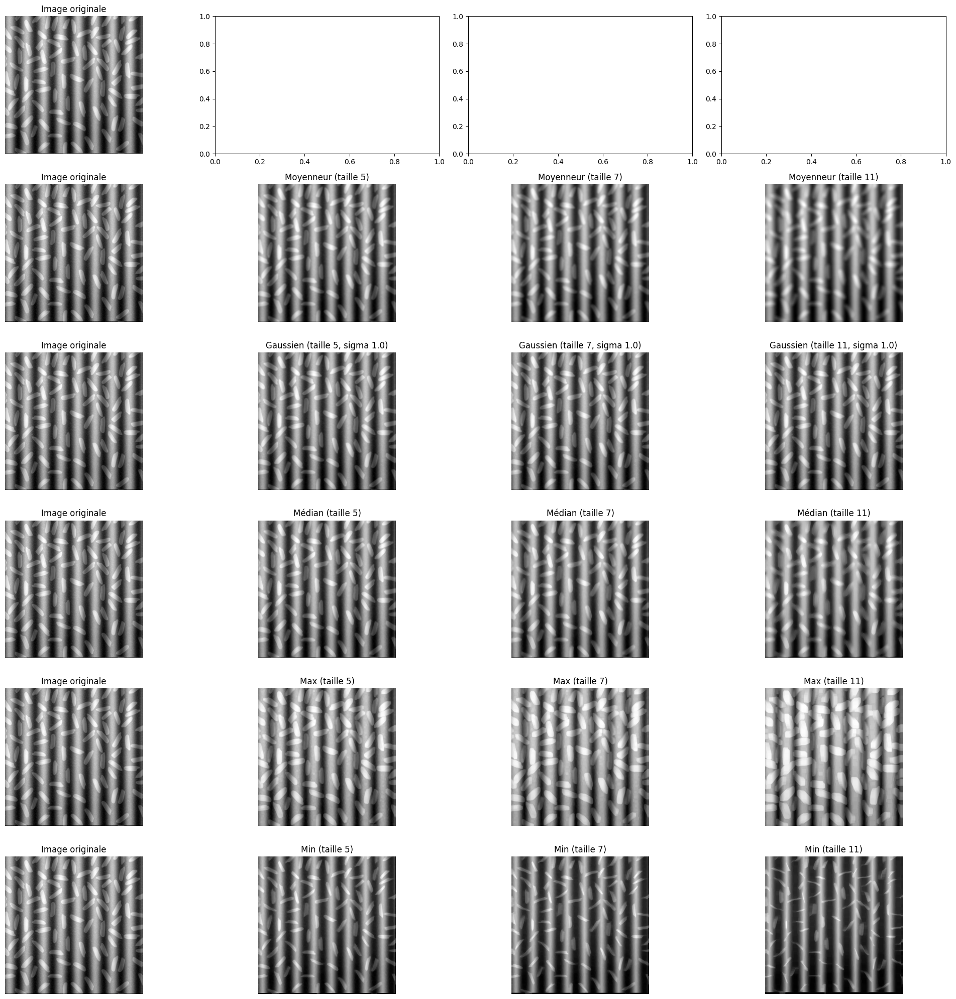

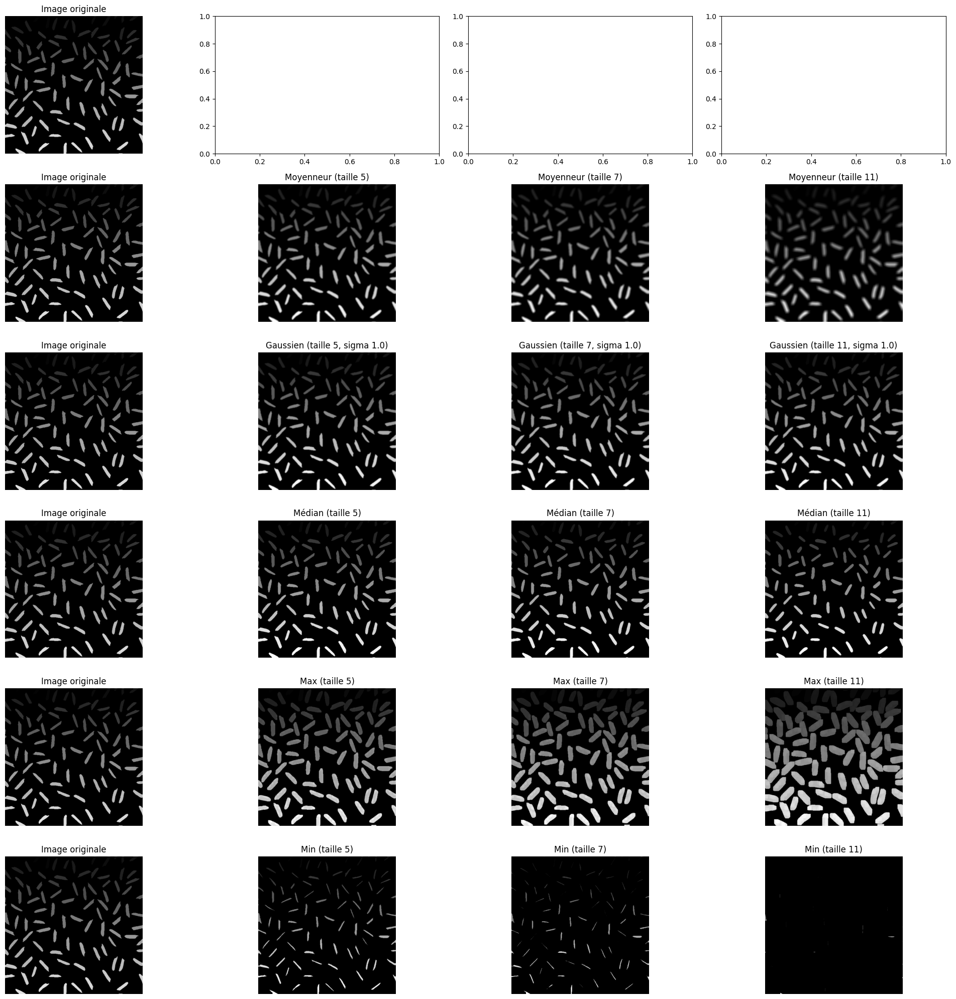

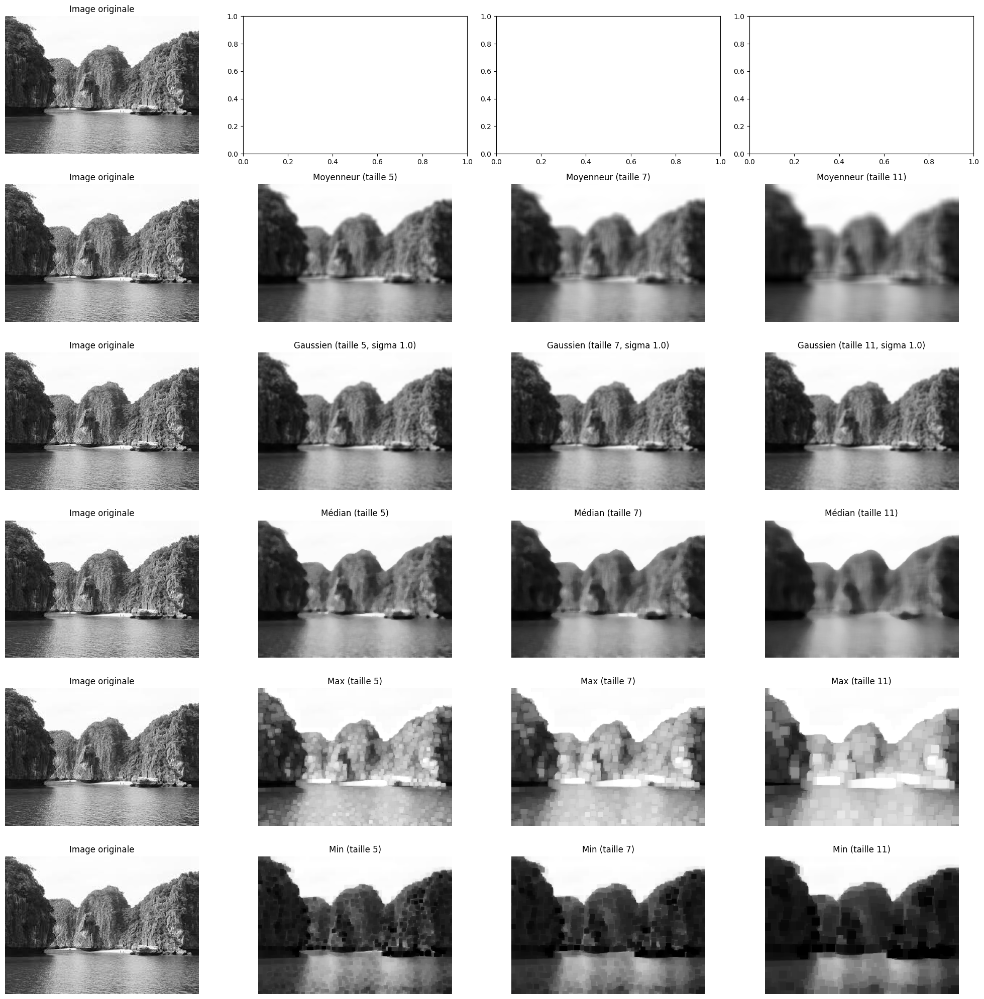

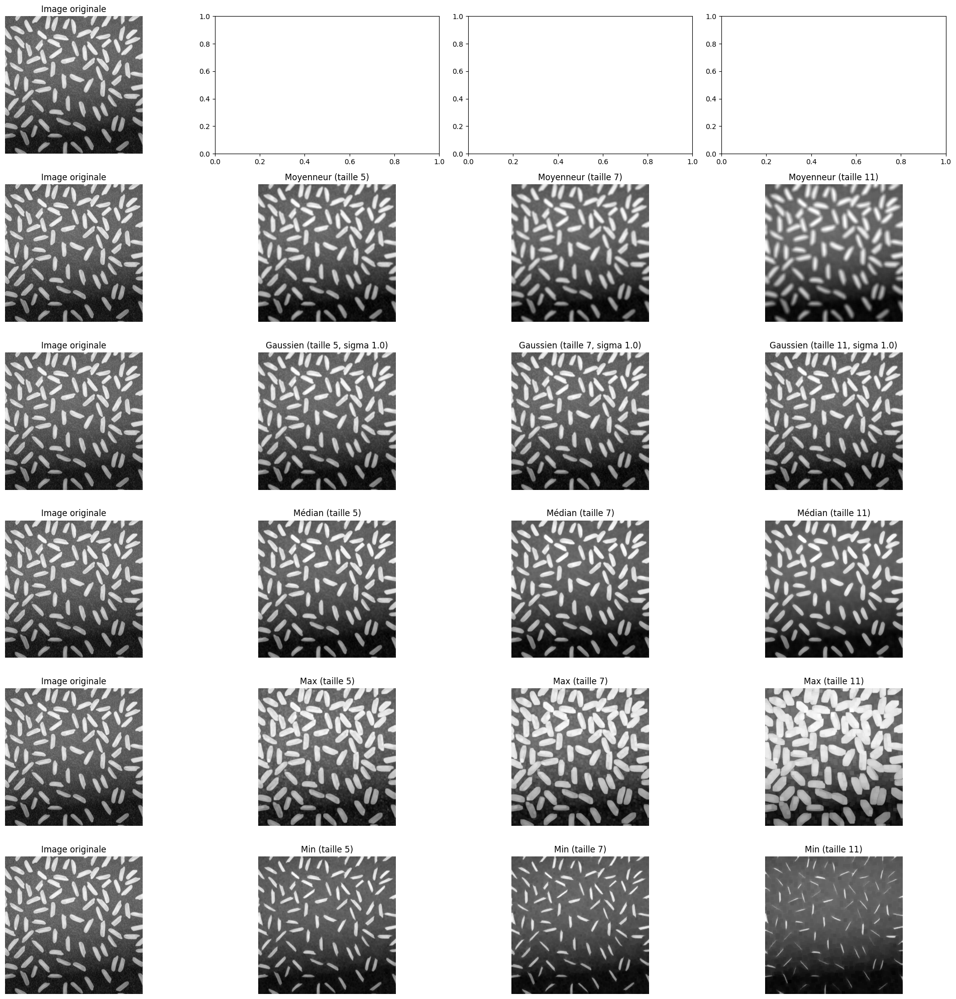

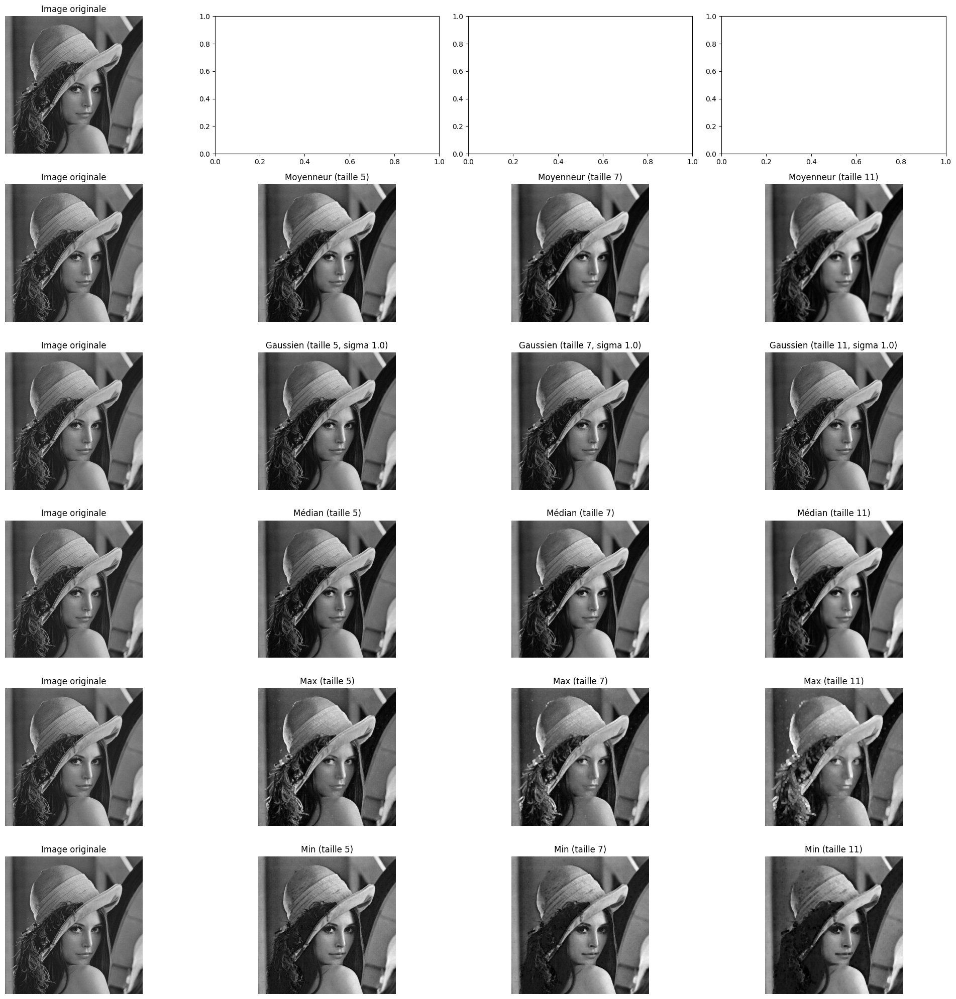

In [ ]:
# Importation des bibliothèques
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

from google.colab import drive
drive.mount('/content/drive')

# Fonction pour afficher une image en niveaux de gris
def show_image(image, ax, title='Image'):
    ax.imshow(image, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

# Chemin du dossier contenant les images
images_path = "/content/drive/MyDrive/Traitement_image"

# Tableau pour stocker les chemins des images
chemins_images = []

# Parcours du dossier d'images et ajout des chemins à la liste
for fichier in os.listdir(images_path):
    path_image = os.path.join(images_path, fichier)
    # Vérification de l'existence du fichier
    if os.path.isfile(path_image):
        chemins_images.append(path_image)

# Filtre moyenneur
def apply_mean_filter(image, ksize):
    return cv2.blur(image, (ksize, ksize))

# Filtre gaussien
def apply_gaussian_filter(image, ksize, sigma):
    return cv2.GaussianBlur(image, (ksize, ksize), sigma)

# Filtre médian
def apply_median_filter(image, ksize):
    return cv2.medianBlur(image, ksize)

# Filtre max/min
def apply_max_filter(image, ksize):
    kernel = np.ones((ksize, ksize), np.uint8)
    return cv2.dilate(image, kernel)

def apply_min_filter(image, ksize):
    kernel = np.ones((ksize, ksize), np.uint8)
    return cv2.erode(image, kernel)

# Paramètres des filtres
ksize_list = [5, 7, 11]  # Tailles de filtre à tester
sigma = 1.0  # Sigma pour le filtre gaussien

# Parcours des images et affichage de leurs histogrammes
for chemin_image in chemins_images:
    # Lecture de l'image en niveaux de gris
    image = cv2.imread(chemin_image, cv2.IMREAD_GRAYSCALE)

    # Nombre de colonnes nécessaires
    num_cols = len(ksize_list) + 1

    # Créer une figure avec des sous-intrigues
    fig, axes = plt.subplots(6, num_cols, figsize=(20, 20))

    # Afficher l'image originale dans la première colonne de chaque ligne
    for i in range(6):
        show_image(image, axes[i, 0], 'Image originale')

    # Appliquer et afficher les résultats pour chaque filtre et chaque taille de filtre
    for j, ksize in enumerate(ksize_list):
        # Filtre moyenneur
        mean_filtered = apply_mean_filter(image, ksize)
        show_image(mean_filtered, axes[1, j + 1], f'Moyenneur (taille {ksize})')

        # Filtre gaussien
        gaussian_filtered = apply_gaussian_filter(image, ksize, sigma)
        show_image(gaussian_filtered, axes[2, j + 1], f'Gaussien (taille {ksize}, sigma {sigma})')

        # Filtre médian
        median_filtered = apply_median_filter(image, ksize)
        show_image(median_filtered, axes[3, j + 1], f'Médian (taille {ksize})')

        # Filtre max
        max_filtered = apply_max_filter(image, ksize)
        show_image(max_filtered, axes[4, j + 1], f'Max (taille {ksize})')

        # Filtre min
        min_filtered = apply_min_filter(image, ksize)
        show_image(min_filtered, axes[5, j + 1], f'Min (taille {ksize})')

    # Cacher les axes inutilisés
    for i in range(6):
        for j in range(len(ksize_list) + 1, num_cols):
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()


DÉTECTION DES CONTOURS

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


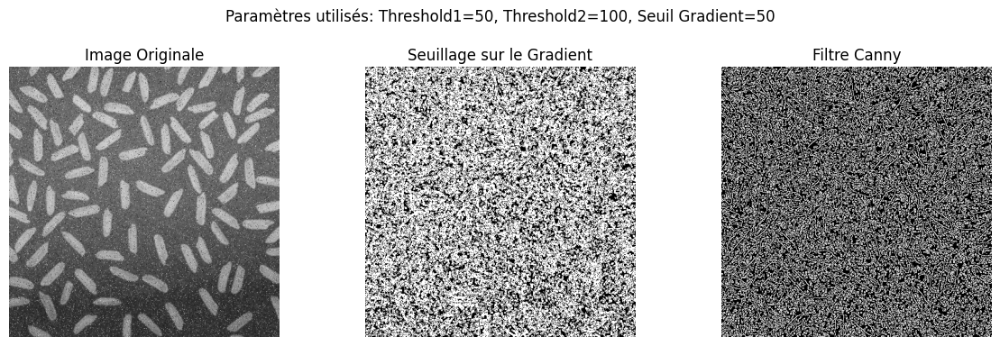

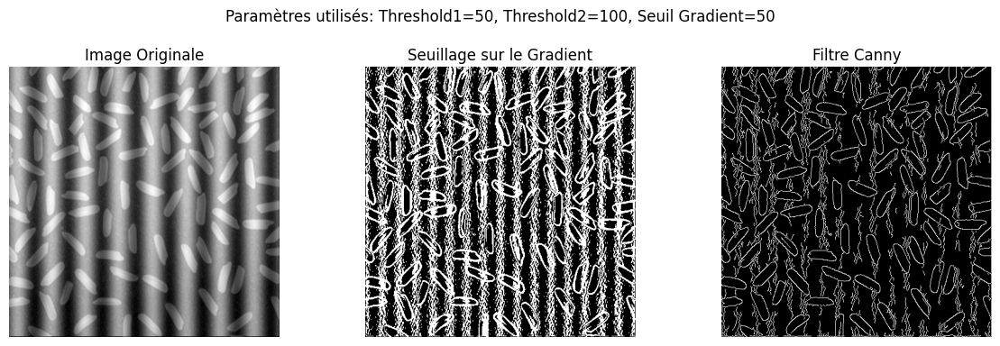

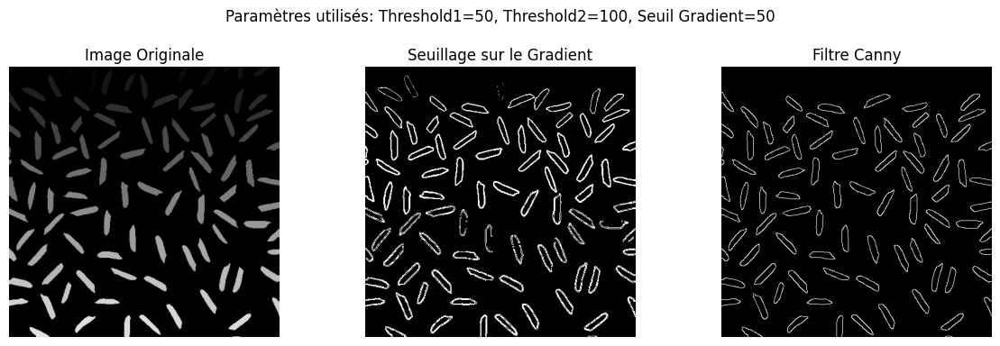

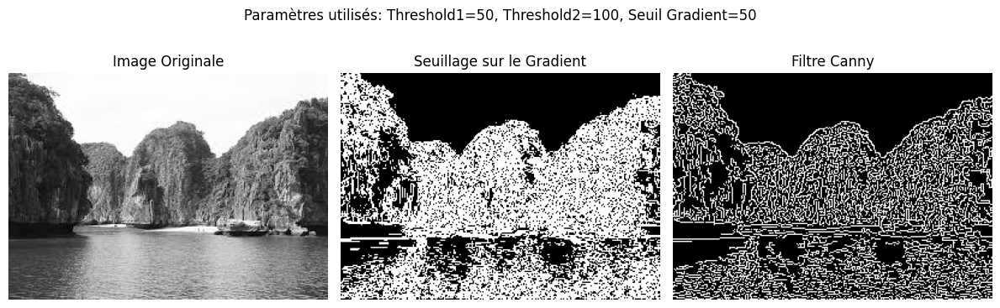

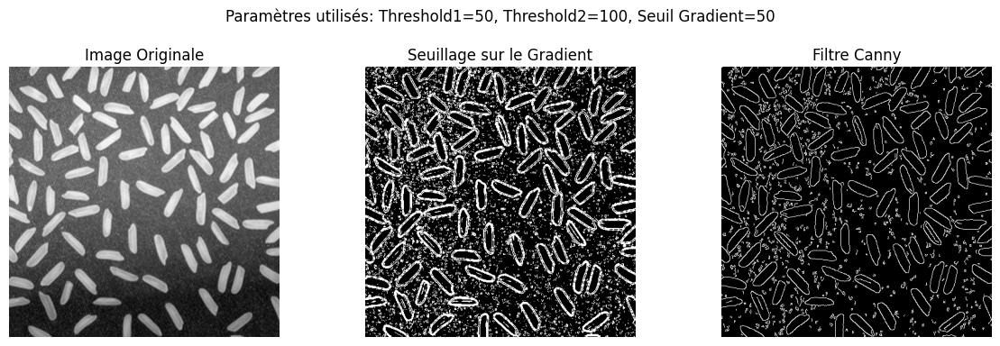

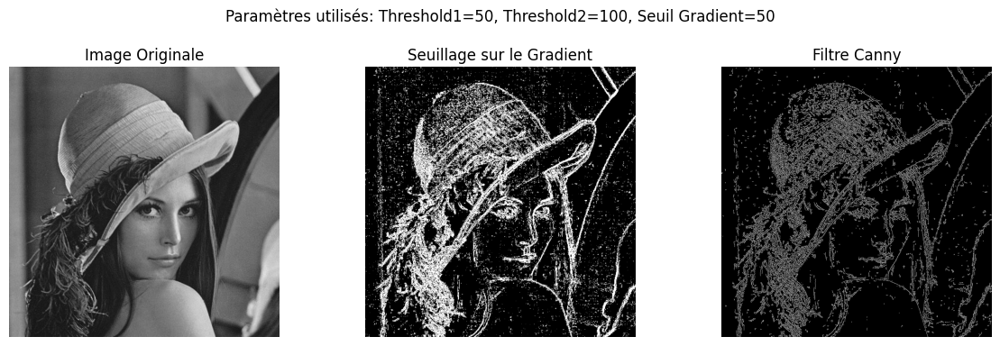

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Monter Google Drive (si vous utilisez Google Colab)
from google.colab import drive
drive.mount('/content/drive')

# Fonction pour afficher une image en niveaux de gris
def show_image(image, ax, title='Image'):
    ax.imshow(image, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

# Chemin du dossier contenant les images
images_path = "/content/drive/MyDrive/Traitement_image"

# Tableau pour stocker les chemins des images
chemins_images = []

# Parcours du dossier d'images et ajout des chemins à la liste
for fichier in os.listdir(images_path):
    path_image = os.path.join(images_path, fichier)
    # Vérification de l'existence du fichier
    if os.path.isfile(path_image):
        chemins_images.append(path_image)

# Boucle sur chaque image
for chemin_image in chemins_images:
    # Lire l'image en niveaux de gris
    img = cv2.imread(chemin_image, cv2.IMREAD_GRAYSCALE)

    # Vérification de l'existence de l'image
    if img is None:
        continue

    # Appliquer le filtre Canny
    edges_canny = cv2.Canny(img, threshold1=50, threshold2=100)

    # Calculer le gradient de l'image
    gradient_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)

    # Calculer la norme du gradient
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2).astype(np.uint8)

    # Appliquer un seuillage sur la norme du gradient
    _, edges_threshold = cv2.threshold(gradient_magnitude, 50, 255, cv2.THRESH_BINARY) # Vous pouvez ajuster le seuil

    # Afficher les résultats pour chaque image
    plt.figure(figsize=(12, 4))
    plt.subplot(131)
    plt.imshow(img, cmap='gray')
    plt.title("Image Originale")
    plt.axis('off')
    plt.subplot(132)
    plt.imshow(edges_threshold, cmap='gray')
    plt.title("Seuillage sur le Gradient")
    plt.axis('off')
    plt.subplot(133)
    plt.imshow(edges_canny, cmap='gray')
    plt.title("Filtre Canny")
    plt.axis('off')
    plt.suptitle(f'Paramètres utilisés: Threshold1=50, Threshold2=100, Seuil Gradient=50')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajuster la position du titre principal
    plt.show()


Convolution avec un filtre

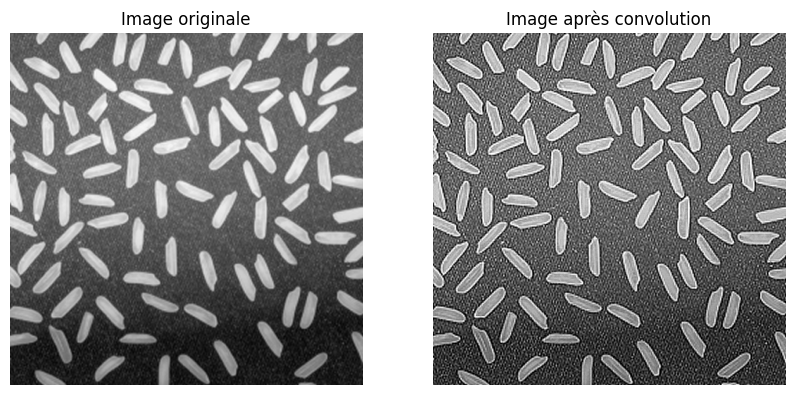

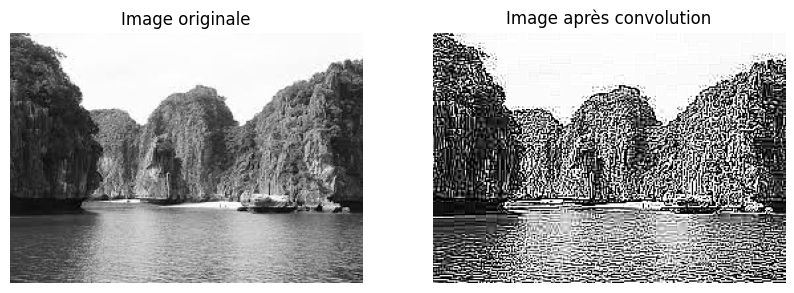

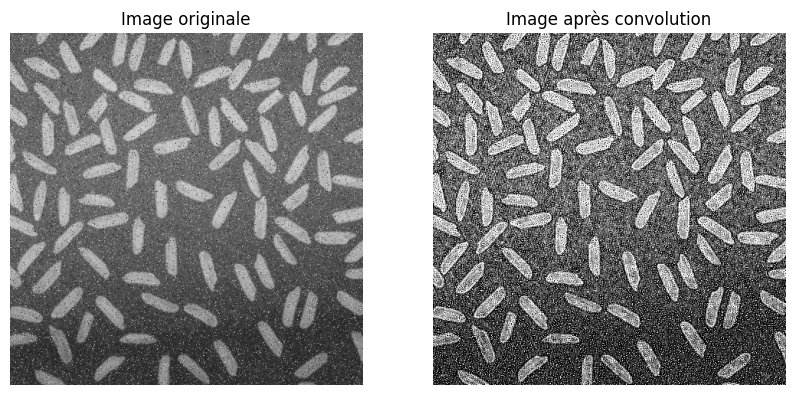

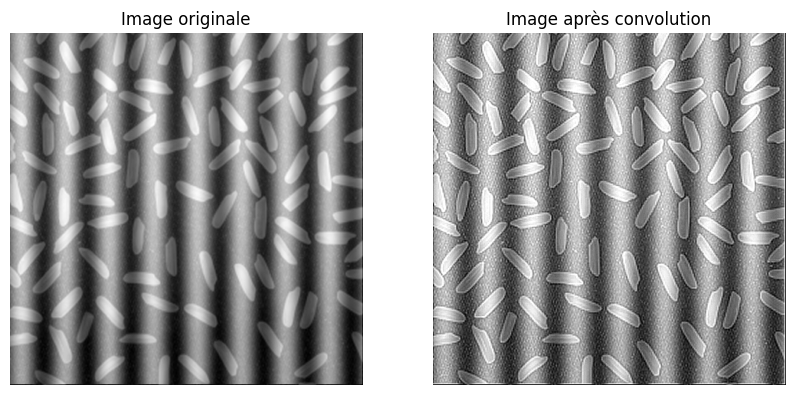

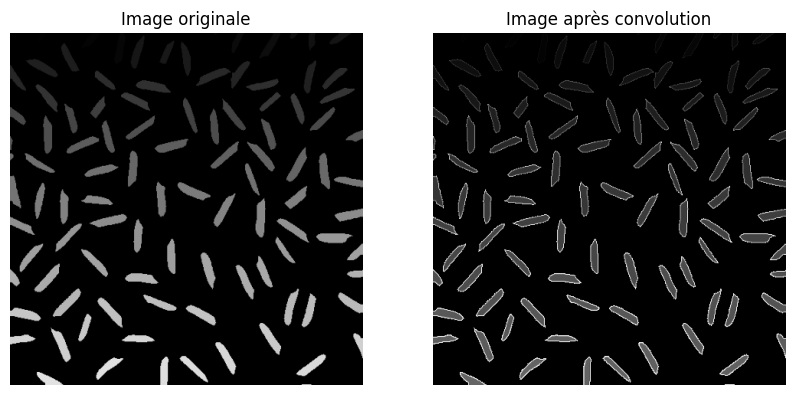

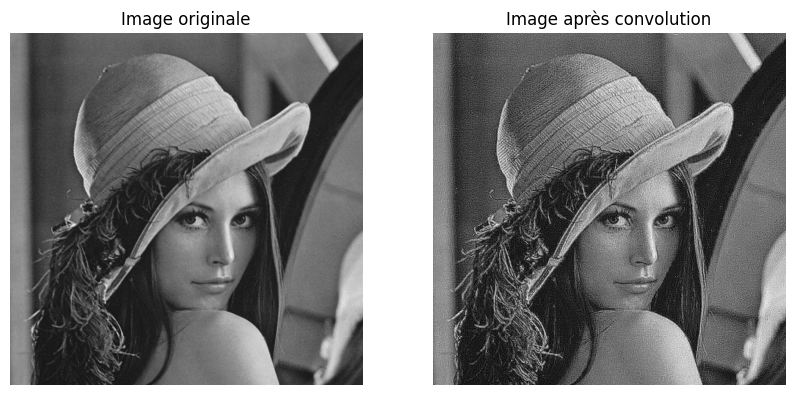

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# Définir le filtre de convolution
kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])

# Chemin du dossier contenant les images
input_folder = '/content/drive/MyDrive/Traitement_image'
output_folder = '/content/drive/MyDrive/Traitement_image_output'

# Créer le dossier de sortie s'il n'existe pas
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Parcourir tous les fichiers dans le dossier d'entrée
for filename in os.listdir(input_folder):
    if filename.endswith('.jpg') or filename.endswith('.png') or filename.endswith('.jpeg'):
        # Construire le chemin complet de l'image
        image_path = os.path.join(input_folder, filename)

        # Charger l'image en niveaux de gris
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Vérifier si l'image est chargée correctement
        if image is not None:
            # Appliquer la convolution
            sharpened = cv2.filter2D(image, -1, kernel)

            # Construire le chemin complet de l'image de sortie
            output_path = os.path.join(output_folder, filename)

            # Enregistrer l'image filtrée
            cv2.imwrite(output_path, sharpened)

            # Optionnel: Afficher l'image originale et l'image filtrée
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(image, cmap='gray')
            plt.title('Image originale')
            plt.axis('off')
            plt.subplot(1, 2, 2)
            plt.imshow(sharpened, cmap='gray')
            plt.title('Image après convolution')
            plt.axis('off')
            plt.show()
        else:
            print(f"Impossible de charger l'image {image_path}")
